<a href="https://colab.research.google.com/github/esuda/mineiracao_dados_complexos/blob/master/Trabalho3_DCGAN-fer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Trabalho 3

Esse notebook serve como base para o desenvolvimento da Trabalho 3, e deve ser submetido após a conclusão das atividades propostas. 

Neste trabalho, iremos utilizar uma Rede Generativa Adversarial (GAN) para gerar dígitos de casas do *dataset* SVHN (*Street View House Numbers*). GANs são formadas por duas redes (discriminador e gerador) que são treinadas simultaneamente, sem compartilhamento de pesos. O gerador é responsável por aprender a transformar um ruído aleatório em uma imagem do *dataset* de interesse, enquanto o discriminador é responsável por classificar as imagens em reais e sintéticas (geradas). 

Abaixo, incluímos alguns imports, e mostramos uma maneira de processar o arquivo `train_32x32.mat` (pode ser baixado [aqui](http://ufldl.stanford.edu/housenumbers/train_32x32.mat)) que contém as imagens do dataset [SVHN](http://ufldl.stanford.edu/housenumbers/).

Sugerimos que o código da prática 8 seja estudado, e o mesmo **pode** servir de base para este trabalho, já que o procedimento de treino da GAN não muda.

## Depois de cada atividade, inclua uma breve análise do que foi feito e dos resultados!

# Imports
Vamos importar as dependências necessárias!

In [ ]:
from __future__ import print_function, division

from tensorflow.keras import layers
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import mnist

import sys
import matplotlib.pyplot as plt
import numpy as np

from scipy.io import loadmat

In [ ]:
# Caso queira carregar os dados do drive, descomente as linhas seguintes:

from google.colab import drive

drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!pip install scipy

In [ ]:
!pip install wget

  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9672 sha256=7f5fd8ce7abf0213b71b2c014308c2ee64a097201ce8d16e0e79a5a0ce6e2e14
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built wget


In [ ]:
import wget

In [ ]:
train = 'http://ufldl.stanford.edu/housenumbers/train_32x32.mat'
test = 'http://ufldl.stanford.edu/housenumbers/test_32x32.mat'


In [ ]:
save_folder = './gdrive/MyDrive/House Numbers/'

In [ ]:
wget.download(train,save_folder)

'./gdrive/MyDrive/House Numbers//train_32x32.mat'

In [ ]:
wget.download(test,save_folder)

'./gdrive/MyDrive/House Numbers//test_32x32.mat'

# Carregue o dataset SVHN

Os dados são fornecidos em um arquivo .mat, que armazena um dicionário.

Para acessar os dados armazenados, utilizamos a função `loadmat` do pacote `scipy`.  Para acessar as imagens, acessamos o campo `['X']` desse dicionário. Um exemplo é mostrado abaixo:

Obs.: Lembre-se que para o Keras usando Tensorflow como backend, a dimensão dos canais deve ser a última do seu vetor.

(73257, 32, 32, 3)


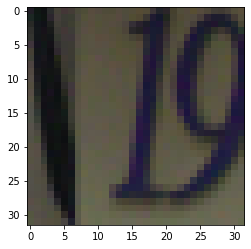

In [ ]:
# Load the dataset
X_train = loadmat('./gdrive/MyDrive/House Numbers//train_32x32.mat')['X']

X_train = np.moveaxis(X_train, -1, 0)
X_train = X_train/255.
print(X_train.shape)

plt.imshow(X_train[0])


# Vanilla GAN com o SVHN
A rede mostrada na prática 8 gerava os dígitos do MNIST utilizando camadas densas. Apesar de também conter dígitos, o SVHN possui imagens maiores (32x32), e 3 canais (RGB). Essas diferenças fazem com que a rede precise ser levemente adaptada para poder trabalhar com o novo dataset e gerar novas amostras.

Portanto, altere o código da prática 8 para gerar dados do dataset SVHN com as camadas Densas da 'Vanilla' GAN, e mostre os resultados. A 'Vanilla' GAN conseguiu gerar as imagens do (mais complexo) dataset SVHN?


In [ ]:
def build_generator(latent_dim, img_shape):
  model = Sequential()

  model.add(layers.Dense(256, input_dim=latent_dim))
  model.add(layers.LeakyReLU(alpha=0.2))
  model.add(layers.BatchNormalization(momentum=0.8))
  model.add(layers.Dense(512))
  model.add(layers.LeakyReLU(alpha=0.2))
  model.add(layers.BatchNormalization(momentum=0.8))
  model.add(layers.Dense(1024))
  model.add(layers.LeakyReLU(alpha=0.2))
  model.add(layers.BatchNormalization(momentum=0.8))
  model.add(layers.Dense(np.prod(img_shape), activation='tanh'))
  model.add(layers.Reshape(img_shape))

  #model.summary()

  noise = layers.Input(shape=(latent_dim,))
  img = model(noise)

  return Model(noise, img)

def build_discriminator(img_shape):

  model = Sequential()

  model.add(layers.Flatten(input_shape=img_shape))
  model.add(layers.Dense(512))
  model.add(layers.LeakyReLU(alpha=0.2))
  model.add(layers.Dense(256))
  model.add(layers.LeakyReLU(alpha=0.2))
  model.add(layers.Dense(1, activation='sigmoid'))
  #model.summary()

  img = layers.Input(shape=img_shape)
  validity = model(img)

  return Model(img, validity)

def sample_images(iter, generator):
    r, c = 5, 5
    noise = np.random.normal(0, 1, (r * c, latent_dim))
    gen_imgs = generator.predict(noise)

    # Re-escale as imagens para [0, 1] para plotar.
    gen_imgs = 0.5 * gen_imgs + 0.5

    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i,j].imshow(gen_imgs[cnt, :,:])
            axs[i,j].axis('off')
            cnt += 1
    plt.show()
    plt.close()

In [ ]:
img_shape = (32, 32, 3)
latent_dim = 100

optimizer = Adam(0.0002, 0.5)

# Constrói e compila o discriminador
discriminator = build_discriminator(img_shape)
discriminator.summary()
discriminator.compile(loss='binary_crossentropy',
    optimizer=optimizer,
    metrics=['accuracy'])


# Constrói o gerador
generator = build_generator(latent_dim, img_shape)

# O gerador recebe ruído aleatório como entrada, e retorna imagens como saída
z = layers.Input(shape=(latent_dim,))
img = generator(z)

# Para o modelo combinado, treinamos apenas o gerador
discriminator.trainable = False

# O discriminador recebe imagens geradas e reais como entrada, e as classifica entre essas duas classes.
validity = discriminator(img)

# O modelo combinado (gerador e discriminador) é utilizado para treinar o gerador a "enganar" o discriminador.
combined = Model(z, validity)
combined.compile(loss='binary_crossentropy', optimizer=optimizer)
print(combined.summary())

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 32, 32, 3)]       0         
                                                                 
 sequential_2 (Sequential)   (None, 1)                 1704961   
                                                                 
Total params: 1,704,961
Trainable params: 1,704,961
Non-trainable params: 0
_________________________________________________________________
Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 100)]             0         
                                                                 
 model_4 (Functional)        (None, 32, 32, 3)         3838720   
                                                                 
 model_3 (Functional)        (No

In [ ]:
batch_size=64

# Ground truth para treinamento. Reais -> 1; Sintéticas (falsas) -> 0
valid = np.ones((batch_size, 1))
fake = np.zeros((batch_size, 1))

0 [D loss: 0.643528, acc.: 86.72%] [G loss: 0.869815]


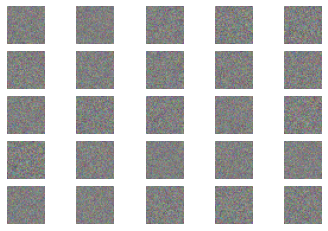

500 [D loss: 0.715076, acc.: 35.94%] [G loss: 0.862912]


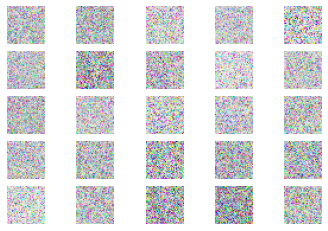

1000 [D loss: 0.710233, acc.: 50.00%] [G loss: 0.840524]


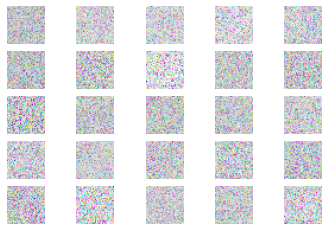

1500 [D loss: 0.701283, acc.: 50.00%] [G loss: 0.802205]


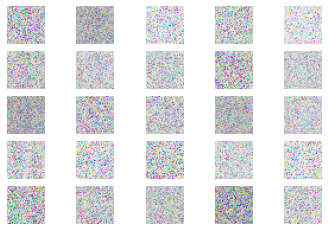

2000 [D loss: 0.700878, acc.: 50.00%] [G loss: 0.755306]


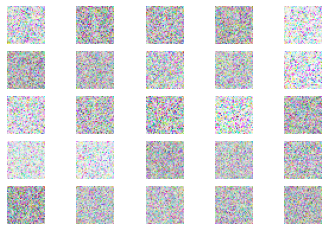

2500 [D loss: 0.701877, acc.: 48.44%] [G loss: 0.728650]


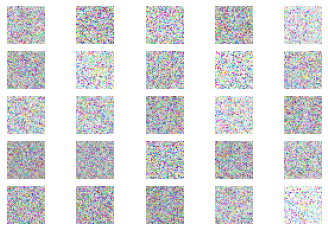

3000 [D loss: 0.704419, acc.: 7.03%] [G loss: 0.700838]


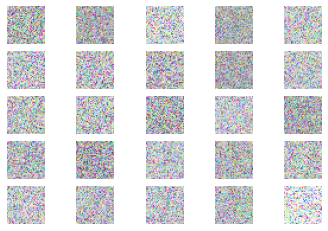

3500 [D loss: 0.716492, acc.: 50.00%] [G loss: 0.691412]


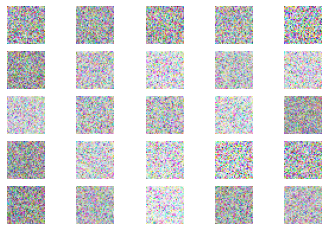

4000 [D loss: 0.750355, acc.: 0.78%] [G loss: 0.728967]


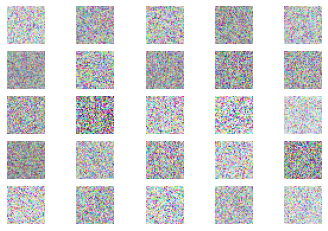

4500 [D loss: 0.701278, acc.: 12.50%] [G loss: 0.714969]


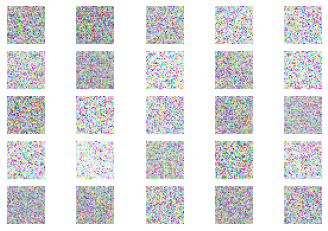

5000 [D loss: 0.700452, acc.: 50.00%] [G loss: 0.701800]


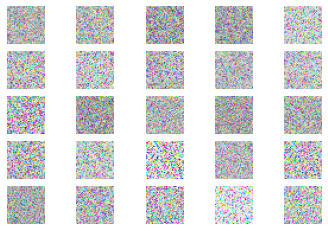

5500 [D loss: 0.704856, acc.: 49.22%] [G loss: 0.691320]


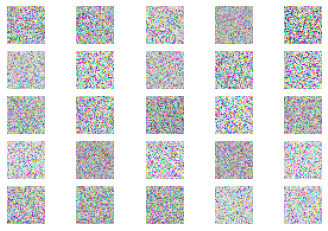

6000 [D loss: 0.700786, acc.: 10.16%] [G loss: 0.704080]


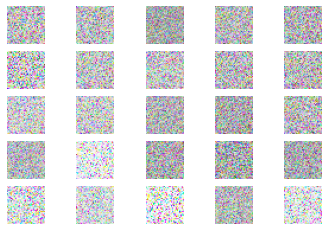

6500 [D loss: 0.702172, acc.: 4.69%] [G loss: 0.701912]


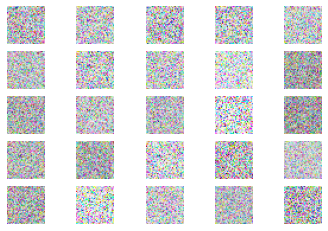

7000 [D loss: 0.697156, acc.: 10.94%] [G loss: 0.703728]


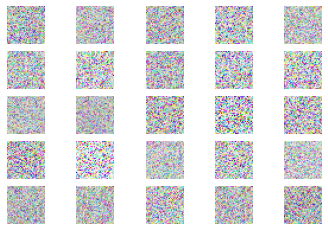

7500 [D loss: 0.699033, acc.: 9.38%] [G loss: 0.715330]


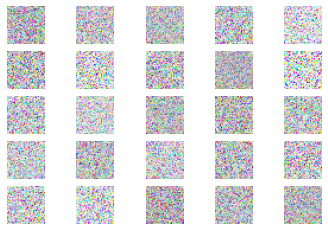

8000 [D loss: 0.704194, acc.: 32.03%] [G loss: 0.723973]


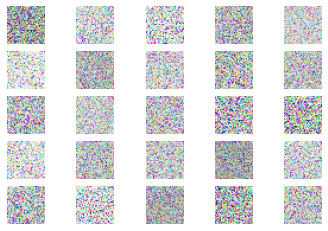

8500 [D loss: 0.724308, acc.: 3.12%] [G loss: 0.753624]


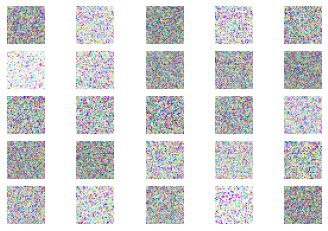

9000 [D loss: 0.714099, acc.: 0.00%] [G loss: 0.712248]


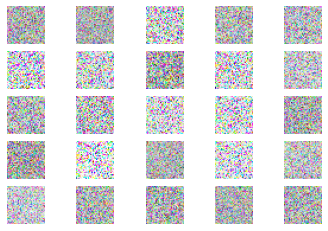

9500 [D loss: 0.704104, acc.: 49.22%] [G loss: 0.761875]


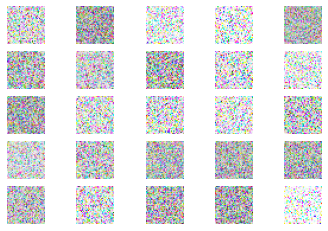

10000 [D loss: 0.695519, acc.: 39.84%] [G loss: 0.728457]


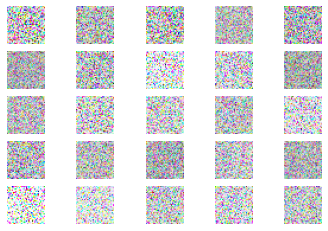

10500 [D loss: 0.697414, acc.: 42.97%] [G loss: 0.705984]


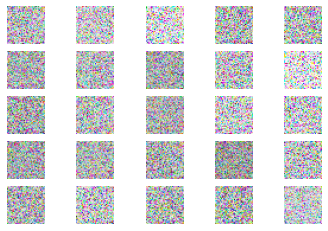

11000 [D loss: 0.737467, acc.: 7.03%] [G loss: 0.777472]


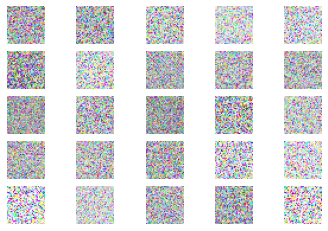

11500 [D loss: 0.700244, acc.: 38.28%] [G loss: 0.698892]


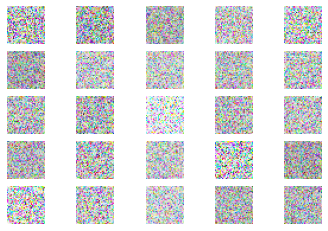

12000 [D loss: 0.708772, acc.: 32.03%] [G loss: 0.771495]


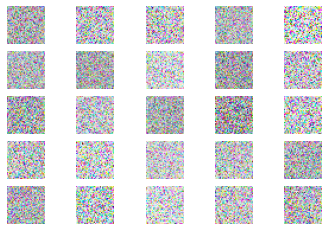

12500 [D loss: 0.646508, acc.: 68.75%] [G loss: 0.985278]


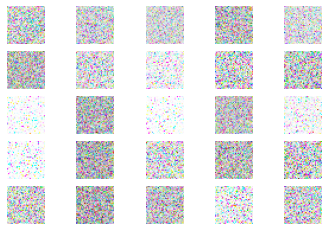

13000 [D loss: 0.605678, acc.: 68.75%] [G loss: 1.112724]


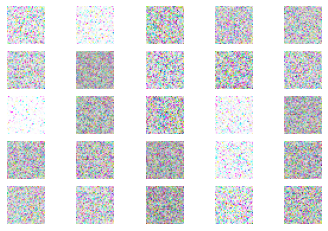

13500 [D loss: 0.629832, acc.: 71.09%] [G loss: 0.935471]


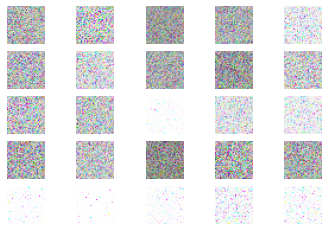

14000 [D loss: 0.695477, acc.: 49.22%] [G loss: 1.026320]


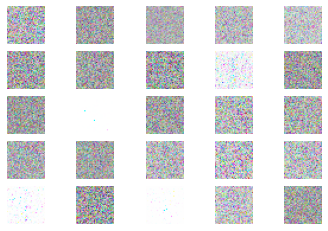

14500 [D loss: 0.659536, acc.: 60.94%] [G loss: 0.792367]


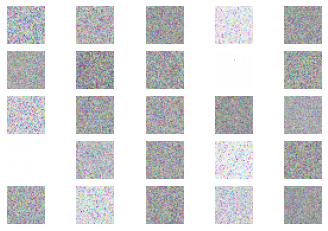

15000 [D loss: 0.680695, acc.: 51.56%] [G loss: 0.817673]


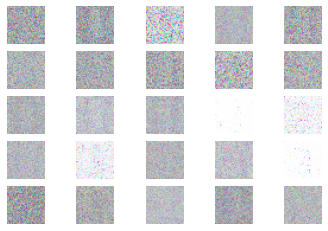

15500 [D loss: 0.670220, acc.: 61.72%] [G loss: 0.741473]


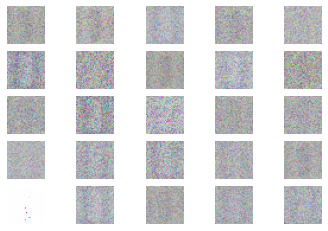

16000 [D loss: 0.676591, acc.: 53.12%] [G loss: 0.803900]


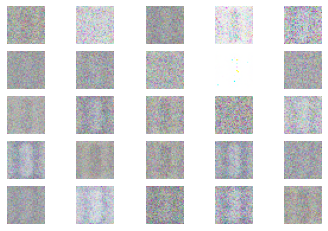

16500 [D loss: 0.663867, acc.: 60.94%] [G loss: 0.795901]


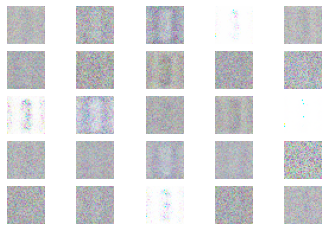

17000 [D loss: 0.681412, acc.: 56.25%] [G loss: 0.717789]


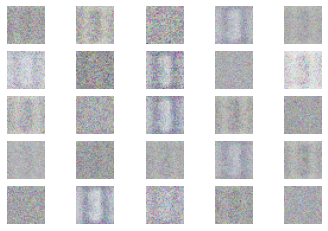

17500 [D loss: 0.716330, acc.: 45.31%] [G loss: 1.650928]


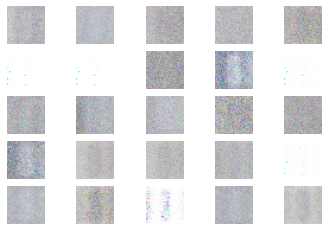

18000 [D loss: 0.572094, acc.: 71.88%] [G loss: 0.966824]


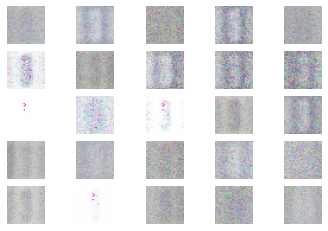

18500 [D loss: 0.671337, acc.: 55.47%] [G loss: 0.925672]


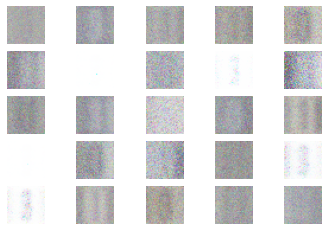

19000 [D loss: 0.667532, acc.: 55.47%] [G loss: 0.862094]


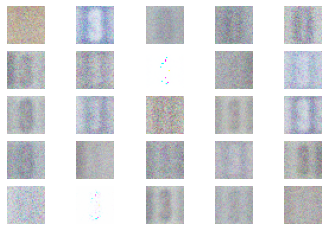

19500 [D loss: 0.794398, acc.: 19.53%] [G loss: 0.792721]


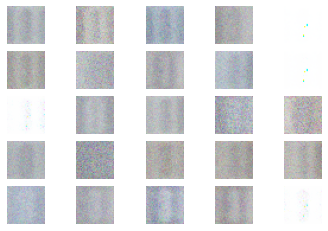

20000 [D loss: 0.627998, acc.: 68.75%] [G loss: 0.929171]


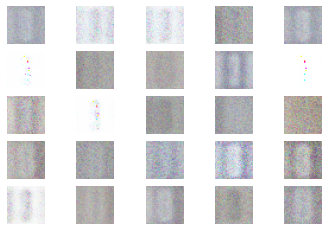

20500 [D loss: 0.643182, acc.: 60.16%] [G loss: 0.915698]


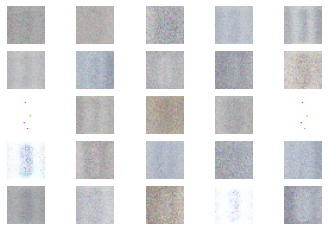

21000 [D loss: 0.595469, acc.: 80.47%] [G loss: 1.051618]


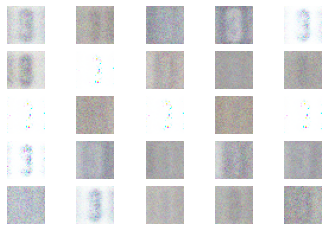

21500 [D loss: 0.471511, acc.: 86.72%] [G loss: 1.729242]


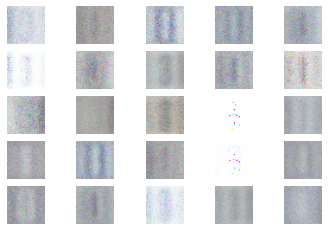

In [ ]:
iterations = 25000
sample_interval=500
batch_size=64
for iter in range(iterations):

  # ---------------------
  #  Treino do Discriminador
  # ---------------------

  # Selecione um batch aleatório de imagens
  idx = np.random.choice(X_train.shape[0], batch_size, replace=False)
  imgs = X_train[idx]

  noise = np.random.normal(0, 1, (batch_size, latent_dim))

  # Gere um batch de imagens sintéticas.
  gen_imgs = generator.predict(noise)

  # Treine o discriminador:
  #    Com imagens reais
  d_loss_real = discriminator.train_on_batch(imgs, valid)
  #    Com imagens sintéticas:
  d_loss_fake = discriminator.train_on_batch(gen_imgs, fake)
  # Faça a média das duas.
  d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

  # ---------------------
  #  Treino do Gerador
  # ---------------------

  # Amostragem de um ruído aleatório
  noise = np.random.normal(0, 1, (batch_size, latent_dim))

  # Treine o gerador, de forma a enganar o discriminador (tentar fazer que ele as classifique as imagens geradas como reais -> passamos 'valid' como ground truth). 
  # Por esse motivo "congelamos" os pesos do discriminador para esse passo!!!
  g_loss = combined.train_on_batch(noise, valid)

  # Plote o progresso a cada 'sample_interval' iterações
  if iter % sample_interval == 0:
      print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (iter, d_loss[0], 100*d_loss[1], g_loss))
      sample_images(iter, generator)

# Arquitetura DCGAN

Defina aqui a arquitetura do gerador e discriminador da DCGAN seguindo o modelo segundo a imagem abaixo:

<img src='https://i.imgur.com/eU2XOxS.png' />

Vamos utilizá-la para gerar os dígitos do SVHN.

In [ ]:
def build_generator(latent_dim, img_shape):
  model = Sequential()
  n_nodes = 128 * 8 * 8
  model.add(layers.Dense(n_nodes, input_dim=latent_dim, activation='relu'))
  model.add(layers.Reshape((8, 8, 128)))

  model.add(layers.UpSampling2D())
  model.add(layers.Conv2D(128, (3,3), strides=(1,1), padding='same'))
  model.add(layers.BatchNormalization(momentum=0.8))
  model.add(layers.ReLU())

  model.add(layers.UpSampling2D())
  model.add(layers.Conv2D(64, (3,3), strides=(1,1), padding='same'))
  model.add(layers.BatchNormalization(momentum=0.8))
  model.add(layers.ReLU())
  model.add(layers.Conv2D(3, (3,3), strides=(1,1), activation='tanh', padding='same'))
  model.add(layers.Reshape(img_shape))

  # model.summary()

  noise = layers.Input(shape=(latent_dim,))
  img = model(noise)

  return Model(noise, img)

def build_discriminator(img_shape):

  model = Sequential()

  model.add(layers.Conv2D(32, (3,3), strides=(2,2), padding='same', input_shape=img_shape))
  model.add(layers.LeakyReLU(alpha=0.2))
  model.add(layers.Dropout(0.25))
  
  model.add(layers.Conv2D(64, (3,3), strides=(2,2), padding='same'))
  model.add(layers.LeakyReLU(alpha=0.2))
  model.add(layers.Dropout(0.25))

  model.add(layers.Conv2D(128, (3,3), strides=(2,2), padding='same'))
  model.add(layers.LeakyReLU(alpha=0.2))
  model.add(layers.Dropout(0.25))

  model.add(layers.Conv2D(256, (3,3), strides=(1,1), padding='same'))
  model.add(layers.LeakyReLU(alpha=0.2))
  model.add(layers.Dropout(0.25))

  model.add(layers.Flatten())
  model.add(layers.Dense(1, activation='sigmoid'))
  
  model.summary()

  img = layers.Input(shape=img_shape)
  validity = model(img)

  return Model(img, validity)

def sample_images(iter, generator):
    r, c = 5, 5
    noise = np.random.normal(0, 1, (r * c, latent_dim))
    gen_imgs = generator.predict(noise)

    # Re-escale as imagens para [0, 1] para plotar.
    gen_imgs = 0.5 * gen_imgs + 0.5

    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i,j].imshow(gen_imgs[cnt, :,:])
            axs[i,j].axis('off')
            cnt += 1
    plt.show()
    plt.close()

# Treine a DCGAN!

Dica: Estude o código mostrado em sala na prática 8, e adapte-o para treinar a DCGAN.

In [ ]:
batch_size=64

# Ground truth para treinamento. Reais -> 1; Sintéticas (falsas) -> 0
valid = np.ones((batch_size, 1))
fake = np.zeros((batch_size, 1))

In [ ]:
img_shape = (32, 32, 3)
latent_dim = 100

optimizer = Adam(0.0005, 0.5)

# Constrói e compila o discriminador
discriminator = build_discriminator(img_shape)
discriminator.summary()
discriminator.compile(loss='binary_crossentropy',
    optimizer=optimizer,
    metrics=['accuracy'])


# Constrói o gerador
generator = build_generator(latent_dim, img_shape)

# O gerador recebe ruído aleatório como entrada, e retorna imagens como saída
z = layers.Input(shape=(latent_dim,))
img = generator(z)

# Para o modelo combinado, treinamos apenas o gerador
discriminator.trainable = False

# O discriminador recebe imagens geradas e reais como entrada, e as classifica entre essas duas classes.
validity = discriminator(img)

# O modelo combinado (gerador e discriminador) é utilizado para treinar o gerador a "enganar" o discriminador.
combined = Model(z, validity)
combined.compile(loss='binary_crossentropy', optimizer=optimizer)
print(combined.summary())

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 16, 16, 32)        896       
                                                                 
 leaky_re_lu_9 (LeakyReLU)   (None, 16, 16, 32)        0         
                                                                 
 dropout_4 (Dropout)         (None, 16, 16, 32)        0         
                                                                 
 conv2d_8 (Conv2D)           (None, 8, 8, 64)          18496     
                                                                 
 leaky_re_lu_10 (LeakyReLU)  (None, 8, 8, 64)          0         
                                                                 
 dropout_5 (Dropout)         (None, 8, 8, 64)          0         
                                                                 
 conv2d_9 (Conv2D)           (None, 4, 4, 128)        

0 [D loss: 0.725554, acc.: 0.78%] [G loss: 0.646603]


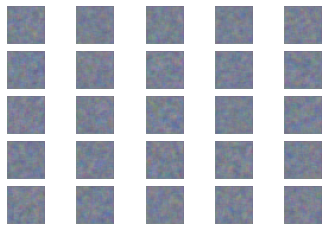

500 [D loss: 0.696333, acc.: 39.84%] [G loss: 0.640338]


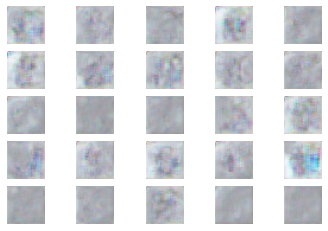

1000 [D loss: 0.682237, acc.: 60.16%] [G loss: 0.703987]


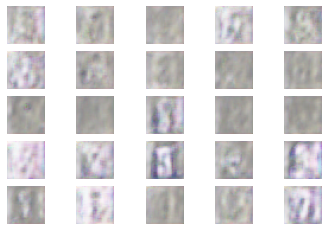

1500 [D loss: 0.697535, acc.: 48.44%] [G loss: 0.715153]


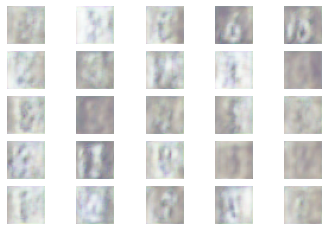

2000 [D loss: 0.611911, acc.: 68.75%] [G loss: 0.938681]


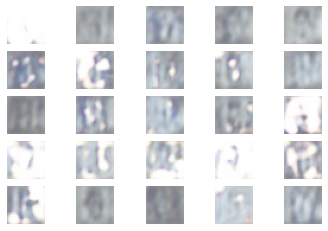

2500 [D loss: 0.699041, acc.: 50.78%] [G loss: 0.714263]


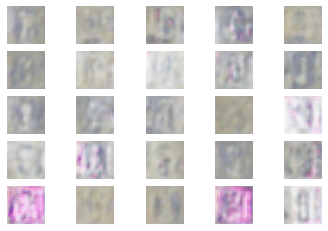

3000 [D loss: 0.692756, acc.: 51.56%] [G loss: 0.700493]


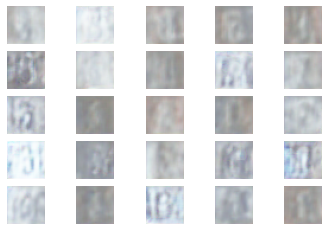

3500 [D loss: 0.686255, acc.: 57.03%] [G loss: 0.714489]


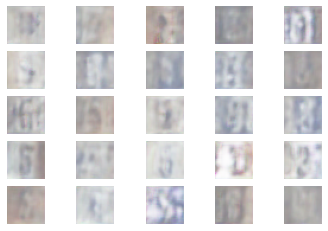

4000 [D loss: 0.690760, acc.: 53.91%] [G loss: 0.809574]


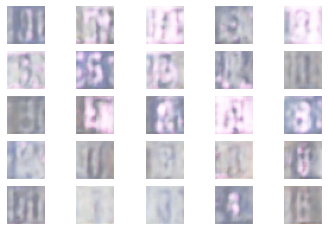

4500 [D loss: 0.708896, acc.: 35.94%] [G loss: 0.724726]


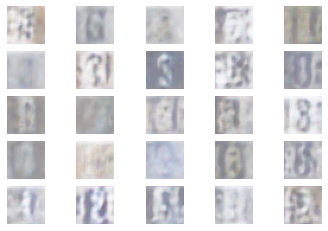

5000 [D loss: 0.696329, acc.: 47.66%] [G loss: 0.736893]


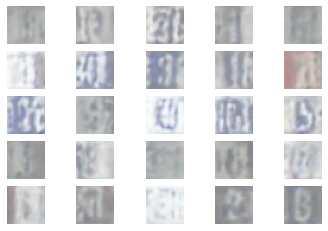

5500 [D loss: 0.681895, acc.: 50.00%] [G loss: 0.742314]


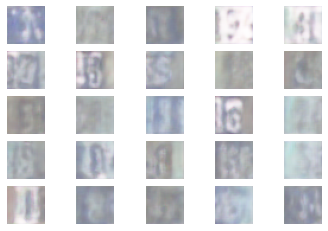

6000 [D loss: 0.676288, acc.: 57.81%] [G loss: 0.726657]


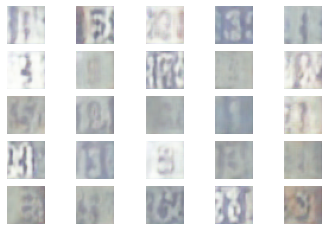

6500 [D loss: 0.688147, acc.: 53.12%] [G loss: 0.744562]


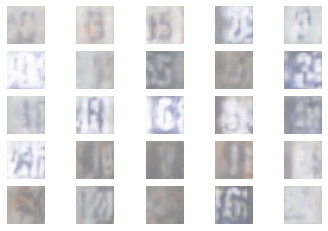

7000 [D loss: 0.680756, acc.: 57.81%] [G loss: 0.710295]


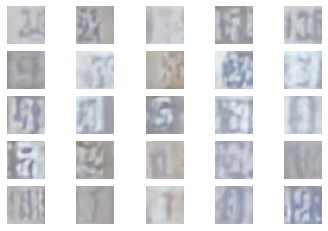

7500 [D loss: 0.697958, acc.: 39.84%] [G loss: 0.725621]


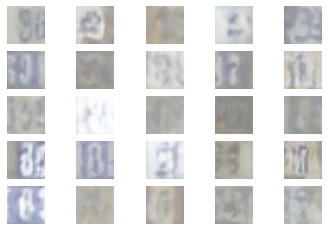

8000 [D loss: 0.691790, acc.: 46.09%] [G loss: 0.731792]


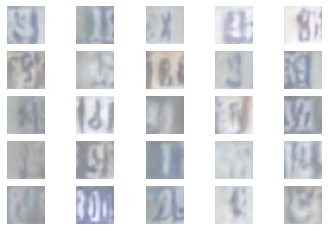

8500 [D loss: 0.679951, acc.: 54.69%] [G loss: 0.763055]


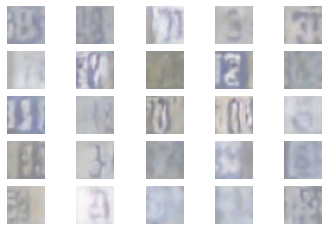

9000 [D loss: 0.701748, acc.: 54.69%] [G loss: 0.731007]


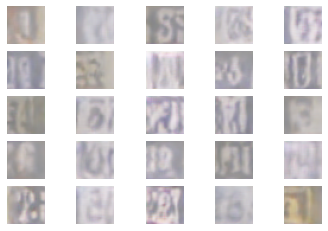

9500 [D loss: 0.689694, acc.: 57.81%] [G loss: 0.745680]


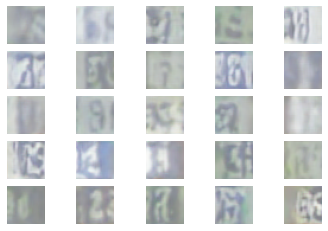

10000 [D loss: 0.704625, acc.: 44.53%] [G loss: 0.719718]


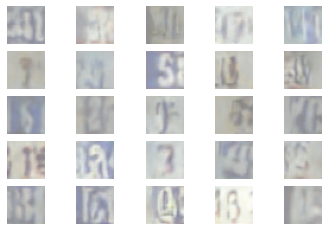

10500 [D loss: 0.652047, acc.: 57.81%] [G loss: 0.845803]


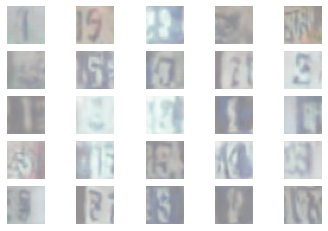

11000 [D loss: 0.677149, acc.: 60.16%] [G loss: 0.722817]


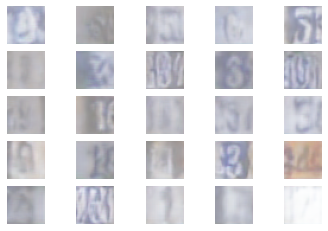

11500 [D loss: 0.655842, acc.: 61.72%] [G loss: 0.800524]


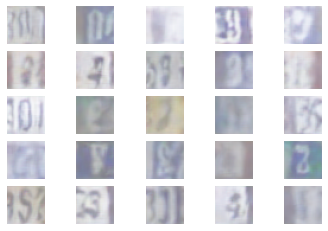

12000 [D loss: 0.709244, acc.: 53.91%] [G loss: 0.751971]


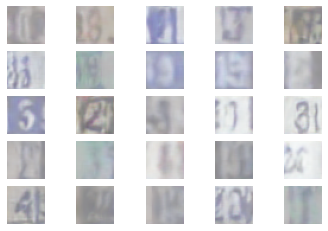

12500 [D loss: 0.675517, acc.: 54.69%] [G loss: 0.797138]


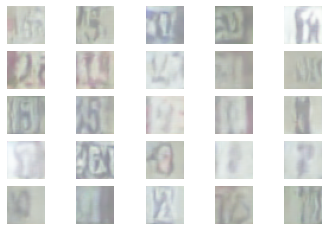

13000 [D loss: 0.690897, acc.: 52.34%] [G loss: 0.767314]


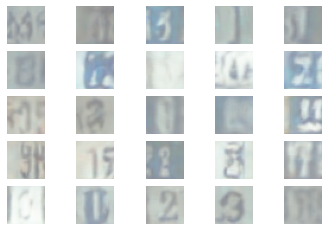

13500 [D loss: 0.703878, acc.: 57.03%] [G loss: 0.792795]


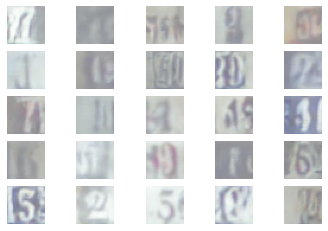

14000 [D loss: 0.655193, acc.: 60.16%] [G loss: 0.807378]


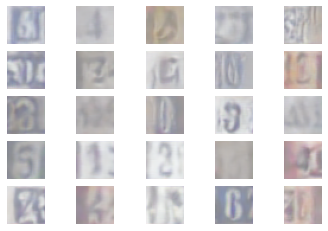

14500 [D loss: 0.688950, acc.: 56.25%] [G loss: 0.802065]


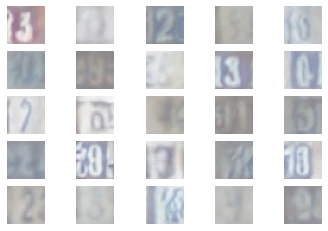

15000 [D loss: 0.648265, acc.: 56.25%] [G loss: 0.802963]


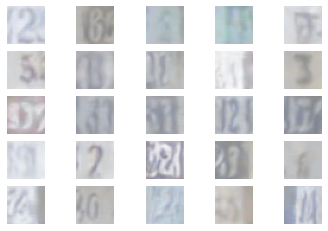

15500 [D loss: 0.638808, acc.: 64.06%] [G loss: 0.875188]


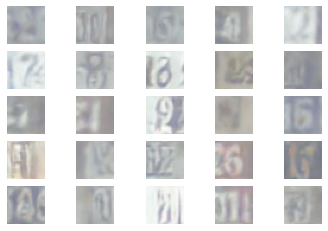

16000 [D loss: 0.674348, acc.: 53.12%] [G loss: 0.760529]


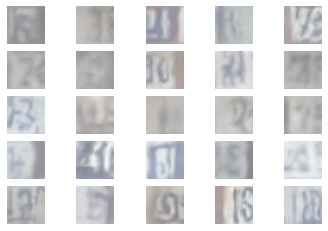

16500 [D loss: 0.677918, acc.: 57.81%] [G loss: 0.771518]


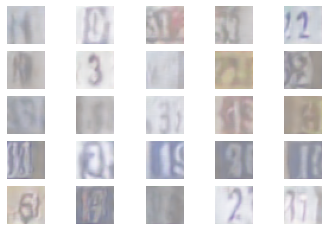

17000 [D loss: 0.672564, acc.: 57.81%] [G loss: 0.811180]


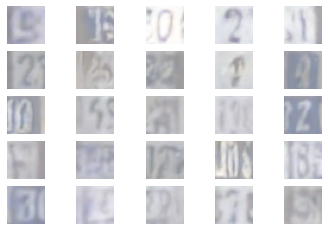

17500 [D loss: 0.646830, acc.: 69.53%] [G loss: 0.824358]


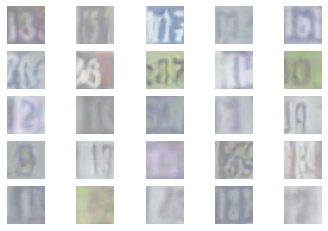

18000 [D loss: 0.668085, acc.: 59.38%] [G loss: 0.792266]


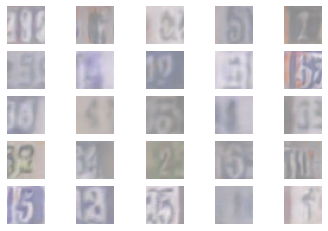

18500 [D loss: 0.677609, acc.: 61.72%] [G loss: 0.799547]


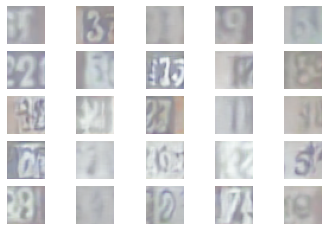

19000 [D loss: 0.660438, acc.: 56.25%] [G loss: 0.778894]


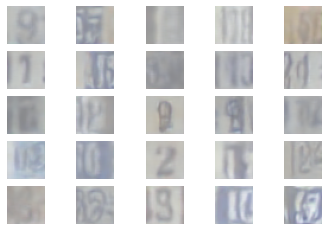

19500 [D loss: 0.678179, acc.: 53.91%] [G loss: 0.826146]


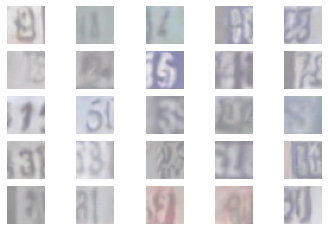

20000 [D loss: 0.718574, acc.: 46.88%] [G loss: 0.850834]


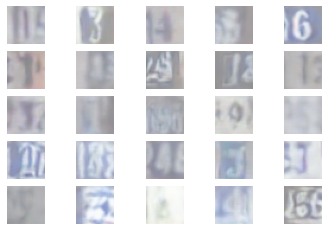

20500 [D loss: 0.692927, acc.: 52.34%] [G loss: 0.752543]


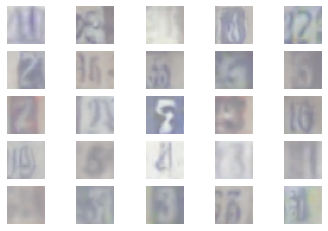

21000 [D loss: 0.665240, acc.: 58.59%] [G loss: 0.837539]


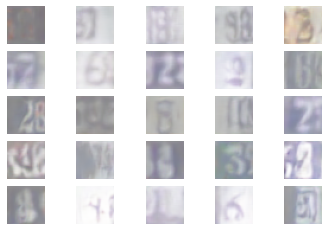

21500 [D loss: 0.678348, acc.: 60.94%] [G loss: 0.739748]


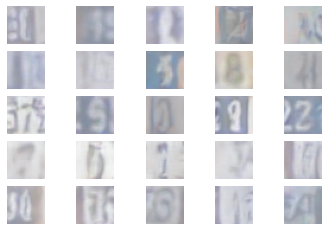

22000 [D loss: 0.663015, acc.: 56.25%] [G loss: 0.835493]


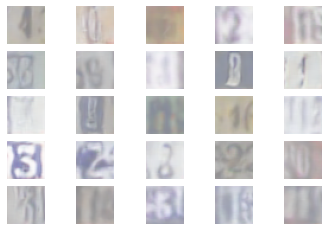

22500 [D loss: 0.671730, acc.: 57.81%] [G loss: 0.850143]


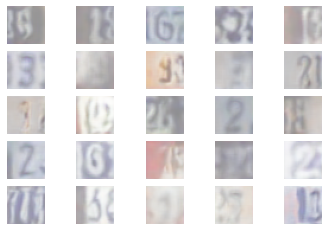

23000 [D loss: 0.684074, acc.: 50.78%] [G loss: 0.823528]


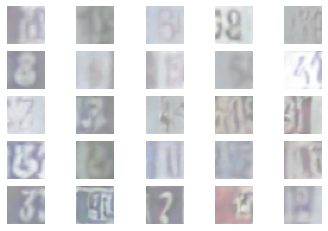

23500 [D loss: 0.669807, acc.: 60.16%] [G loss: 0.800867]


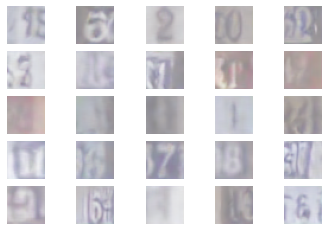

24000 [D loss: 0.637875, acc.: 65.62%] [G loss: 0.842835]


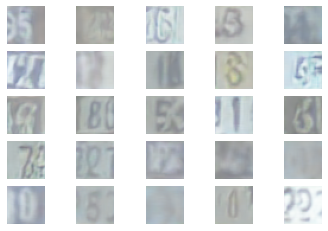

24500 [D loss: 0.685335, acc.: 55.47%] [G loss: 0.834047]


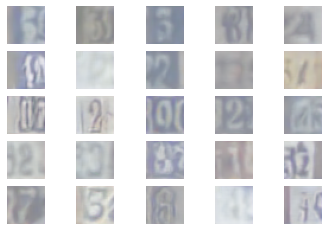

In [ ]:
iterations=25000
sample_interval=500


for iter in range(iterations):

  # ---------------------
  #  Treino do Discriminador
  # ---------------------

  # Selecione um batch aleatório de imagens
  idx = np.random.choice(X_train.shape[0], batch_size, replace=False)
  imgs = X_train[idx]

  noise = np.random.normal(0, 1, (batch_size, latent_dim))

  # Gere um batch de imagens sintéticas.
  gen_imgs = generator.predict(noise)

  # Treine o discriminador:
  #    Com imagens reais
  d_loss_real = discriminator.train_on_batch(imgs, valid)
  #    Com imagens sintéticas:
  d_loss_fake = discriminator.train_on_batch(gen_imgs, fake)
  # Faça a média das duas.
  d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

  # ---------------------
  #  Treino do Gerador
  # ---------------------

  # Amostragem de um ruído aleatório
  noise = np.random.normal(0, 1, (batch_size, latent_dim))

  # Treine o gerador, de forma a enganar o discriminador (tentar fazer que ele as classifique as imagens geradas como reais -> passamos 'valid' como ground truth). 
  # Por esse motivo "congelamos" os pesos do discriminador para esse passo!!!
  g_loss = combined.train_on_batch(noise, valid)

  # Plote o progresso a cada 'sample_interval' iterações
  if iter % sample_interval == 0:
      print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (iter, d_loss[0], 100*d_loss[1], g_loss))
      sample_images(iter, generator)

# Escreva aqui um parágrafo com suas conclusões gerais e análises sobre o experimento proposto.


